In [1]:
from skimage import io
import copy as cp
import torch
from torchvision.models import vgg19
import numpy as np
import matplotlib.pyplot as plt
from time import time
import torch.optim as optim

Student Names : 
Thibaut ELOY
Anthony FRION

Implementation of the method presented in the article : A Neural Algorithm of Artistic Style by Gatys Et Al

In [2]:
"""download pretrained neural network at link : https://web.eecs.umich.edu/~justincj/models/vgg19-d01eb7cb.pth
and put it at this location"""
VGG19_PATH = 'models/vgg19-d01eb7cb.pth'


In [3]:
Conv1_1 = 0
Relu1_1 = 1
Conv1_2 = 2
Relu1_2 = 3
Conv2_1 = 5
Relu2_1 = 6
Conv2_2 = 7
Relu2_2 = 8
Conv3_1 = 10
Relu3_1 = 11
Conv3_2 = 12
Relu3_2 = 13
Conv3_3 = 14
Relu3_3 = 15
Conv3_4 = 16
Relu3_4 = 17
Conv4_1 = 19
Relu4_1 = 20
Conv4_2 = 21
Relu4_2 = 22
Conv4_3 = 23
Relu4_3 = 24
Conv4_4 = 25
Relu4_4 = 26
Conv5_1 = 28
Relu5_1 = 29
Conv5_2 = 30
Relu5_2 = 31
Conv5_3 = 32
Relu5_3 = 33
Conv5_4 = 34
Relu5_4 = 35

In [4]:
mse_loss = torch.nn.MSELoss()

In [5]:
class features_extractor_vgg():
    """class which uses the vgg19 features extracor.
    It allows to get the activations of all the layers of the network at once"""
    def __init__(self):
        #vgg = vgg19(pretrained=False)
        vgg = vgg19(pretrained=False).to(torch.float64)
        vgg.load_state_dict(torch.load(VGG19_PATH), strict=False)
        self.features = cp.deepcopy(vgg.features).to('cpu')
        for param in self.features.parameters():
            param.requires_grad = False
        #print(self.features)



    def forward(self, x, nb_layer=10):
        """get the list of all the activation from the first to the nb_layer-th layer"""
        features_list = []
        for i in range(nb_layer):
            x = self.features[i](x)
            features_list.append(x)
        return features_list

In [6]:
def reshape_rgb_image(image):
    """input : rgb image of size (h, w, c)
    output array of shape (c, h, w)"""
    image = np.array([image[:, :, i] for i in range(3)])
    return image

def reshape_reverse(image):
    """input : rgb image of size (3, h, w)
    output array of shape (h, w, 3)"""
    _, h, w = image.shape
    image_out = np.zeros((h, w, 3))
    for i in range(3):
        image_out[:, :, i] = image[i, :, :]
    return image_out


def preprocessing(image, output_shape, requires_grad=False):
    """preprocessing to apply on style and content images before using the texture synthetis algoithm
    INPUT : - array RGB image of shape (H, W, 3)
    - desired shape for the output (H_out, W_out)
    The image is reshape from (H, W, 3) to (1, 3, H, W) so that it can be fed in a neural network
    Then it is rescaled to the desired shape
    The image is normalized
    It is finally transformed into a tensor"""
    from skimage.transform import resize
    image = reshape_rgb_image(image) # reshape the image from (H, W, 3) to (3, H, W)
    image = np.array([resize(image[i, :, :], output_shape, order=3) for i in range(3)]) # image rescaing
    image = image[None] #add one dimension (3, H, W) --> (1, 3, H, W)
    image = normalize(image) # normalize to get float between 0 and 1
    image_torch = torch.tensor(image, requires_grad=requires_grad) # transform into tensor
    image_torch.to(torch.float64)
    return image_torch

def normalize(im):
    return (im - np.min(im))/(np.max(im)-np.min(im))

In [7]:
def content_loss(generated_image, features_content_image, feature_extractor, layer=Relu2_1):
    features_generated_image = feature_extractor.forward(generated_image, nb_layer=layer+1)[-1]
    return mse_loss(features_generated_image, features_content_image)


def style_loss(generated_image, features_style_image, feature_extractor, layers_of_interest):
    features_generated_image = feature_extractor.forward(generated_image, nb_layer=layers_of_interest[-1]+1)
    loss = 0
    for l in layers_of_interest:
        b, c, h, w = features_generated_image[l].shape
        loss_layer = mse_loss(gramm_matrix(features_generated_image[l]), gramm_matrix(features_style_image[l]))
        loss_layer = loss_layer/(4*c*h*w)
        loss = loss + loss_layer
    return loss/len(layers_of_interest)


def gramm_matrix(feature_map):
    """returns the gramm matrix of a feature map"""
    b, c, h, w = feature_map.shape
    resahpe_feature_map = feature_map.view(c, h*w)
    return torch.mm(resahpe_feature_map, resahpe_feature_map.t())

def to_numpy(tensor):
    return normalize(reshape_reverse(tensor.detach().numpy()[0]))

In [8]:
def texture_synthetis_algorithm(style_image, content_image, alpha=1., betha=1., nb_iter=30, lbd=10**-6,
                                layers_style=[Relu1_1, Relu2_1, Relu3_1, Relu4_1, Relu5_1], layer_content=Relu2_1):
    """INPUT : style image and content image , must have the same shaoe
    optional parameters :
    - alpha proportion of style loss compared to content loss
    - nb_iter
    - lbd : step of the gradient descent
    - layers_of_interst : indices of layers to use in the style loss
    Returns : generated image in the form of a np array
    """
    device = "cpu"
    features_extractor = features_extractor_vgg()
    init_image_numpy = 0.001*np.random.random(style_image.shape)
    #generated_image = torch.rand(style_image.shape, requires_grad=True)#.to(torch.float64)
    #generated_image = torch.tensor(content_image)
    generated_image = torch.tensor(init_image_numpy)
    generated_image = generated_image.to(device).requires_grad_(True)
    optimizer = optim.Adam([generated_image], lr=lbd)
    #generated_image = generated_image.to(torch.float64)
    #generated_image.to(torch.float64)
    #generated_image = torch.tensor(content_image, requires_grad=True).to(torch.float64)
    features_content_image = features_extractor.forward(content_image, nb_layer=layer_content + 1)[-1]
    features_style_image = features_extractor.forward(style_image, nb_layer=layers_style[-1] + 1)
    losses = []
    style_losses = []
    content_losses = []
    t = time()
    for i in range(nb_iter):
        def closure():
            t_begin_iter = time()
            #generated_image = torch.tensor(generated_image, requires_grad=True)
            content = content_loss(generated_image, features_content_image, features_extractor, layer=layer_content)
            style = style_loss(generated_image, features_style_image, features_extractor, layers_style)
            loss = alpha * content + betha * style
            losses.append(loss.item())
            style_losses.append(betha * style.item())
            content_losses.append(alpha * content.item())
            loss.backward(retain_graph=True)
            #generated_image = generated_image - lbd * generated_image.grad
            if i%20 == 0:
                print(i)
                print('loss', loss.item())
                print('content loss', alpha * content.item())
                print('style loss', betha * style.item())
                to_save = to_numpy(generated_image)
                plt.imsave(f'iteration{i}.png', to_save)
                plt.imshow(to_save)
                plt.show()
            
            #print('temps iteration', time()-t_begin_iter)
            return loss
        optimizer.step(closure)



    generated_image = to_numpy(generated_image)
    print("tempas écoulé", time() - t)
    return generated_image, losses, style_losses, content_losses


content image


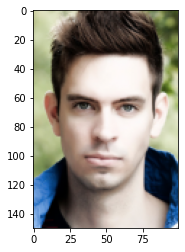

style image


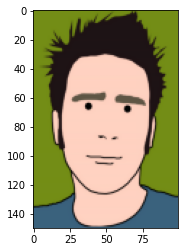

In [9]:
width = 100
height = 150
content_path = 'images/content_images/men2.jpg'
style_path = 'images/style_images/cartoon.png'
content_image = io.imread(content_path)
content_image = preprocessing(content_image, output_shape=(height, width))
style_image = io.imread(style_path)
style_image = preprocessing(style_image, output_shape=(height, width))
print("content image")
plt.imshow(reshape_reverse(content_image[0]))
plt.show()
print("style image")
plt.imshow(reshape_reverse(style_image[0]))
plt.show()

0
loss 1404.0137073015799
content loss 292.5009259045281
style loss 1111.5127813970516


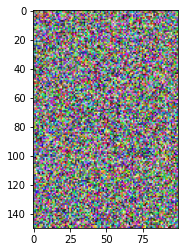

20
loss 1192.4562540887275
content loss 286.8054521094053
style loss 905.6508019793223


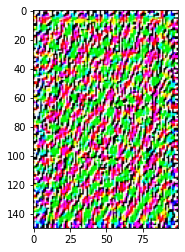

40
loss 1073.8503865254943
content loss 286.73762931962546
style loss 787.1127572058689


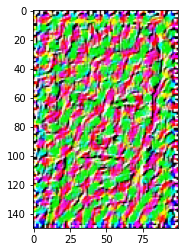

60
loss 1006.8707058184956
content loss 283.13700750510463
style loss 723.733698313391


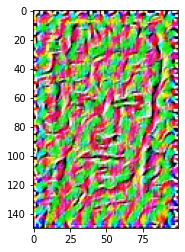

80
loss 975.4816303540915
content loss 281.95072962891805
style loss 693.5309007251734


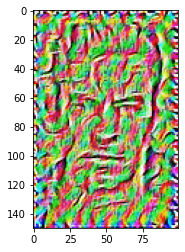

100
loss 942.0715442000985
content loss 284.21744897298214
style loss 657.8540952271164


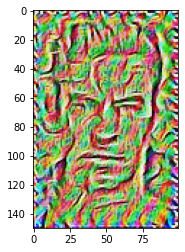

120
loss 916.4871310495416
content loss 288.0958875600396
style loss 628.391243489502


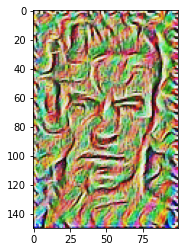

140
loss 893.9106791405228
content loss 291.1223784445672
style loss 602.7883006959556


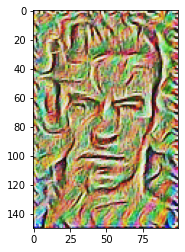

160
loss 874.0858687783073
content loss 293.0531116640395
style loss 581.0327571142678


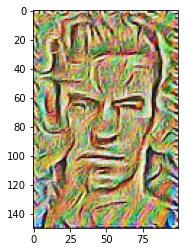

180
loss 855.5459515757759
content loss 294.3034231671851
style loss 561.2425284085908


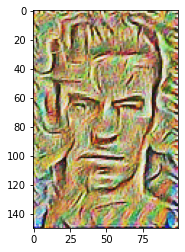

200
loss 841.7295249949666
content loss 295.7923367351067
style loss 545.9371882598599


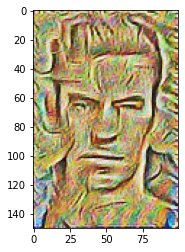

220
loss 829.1019454712962
content loss 297.4416063806477
style loss 531.6603390906484


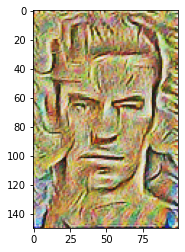

240
loss 812.5025052154699
content loss 298.7459108011883
style loss 513.7565944142816


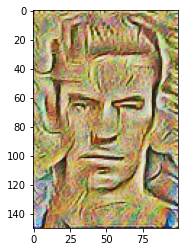

260
loss 796.7223420033555
content loss 299.7904042162524
style loss 496.9319377871031


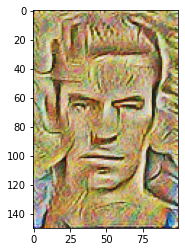

280
loss 787.0083704524859
content loss 300.60213894231475
style loss 486.40623151017115


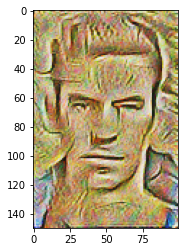

300
loss 780.1303668213666
content loss 301.13334874932815
style loss 478.9970180720384


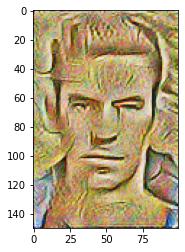

320
loss 772.8249890232871
content loss 301.9216445230188
style loss 470.9033445002683


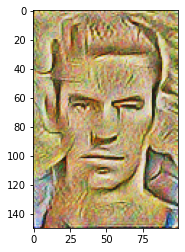

340
loss 769.764687261237
content loss 303.51689975027
style loss 466.24778751096693


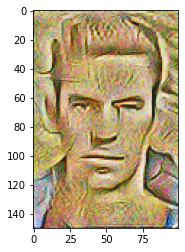

360
loss 771.9249871512228
content loss 305.88082628214835
style loss 466.04416086907446


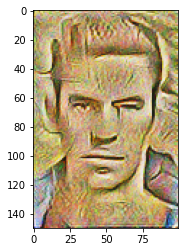

380
loss 774.6083250717404
content loss 308.68865421175707
style loss 465.9196708599834


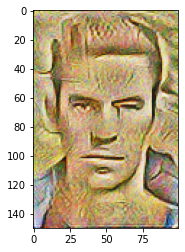

400
loss 778.6272450342401
content loss 311.8534368709897
style loss 466.7738081632504


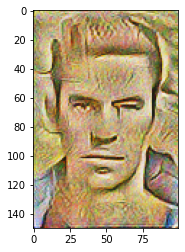

420
loss 781.1165759547466
content loss 315.1337665038656
style loss 465.982809450881


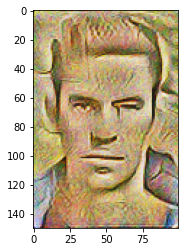

440
loss 779.2896077202431
content loss 318.39032893873184
style loss 460.8992787815112


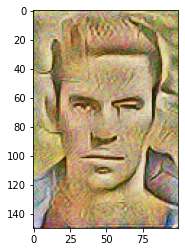

460
loss 775.4395166023583
content loss 321.8907103112005
style loss 453.5488062911577


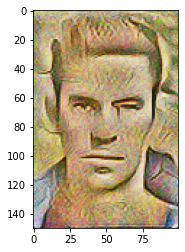

480
loss 776.116707760337
content loss 326.201719690629
style loss 449.91498806970804


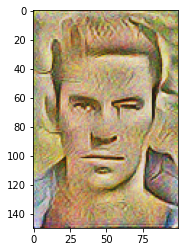

500
loss 779.6140925304334
content loss 331.19890547881494
style loss 448.41518705161843


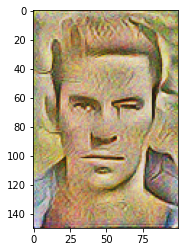

520
loss 779.8834331478731
content loss 336.1324510143355
style loss 443.75098213353766


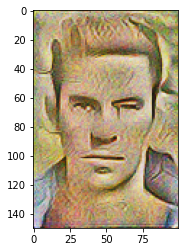

540
loss 776.9174413240644
content loss 340.41768242080184
style loss 436.4997589032625


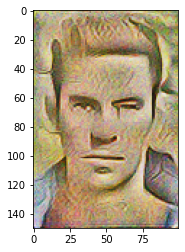

560
loss 773.231433530732
content loss 344.124162179298
style loss 429.107271351434


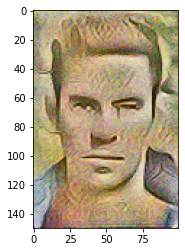

580
loss 770.8708504544993
content loss 347.715122826423
style loss 423.15572762807625


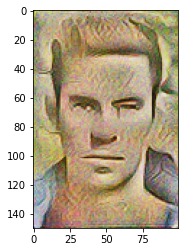

tempas écoulé 512.8082127571106


In [10]:
layers_style = [Relu1_2, Relu2_2, Relu3_3]
layer_content = Relu2_1
generated_image, losses, style_losses, content_losses = \
texture_synthetis_algorithm(style_image, content_image, nb_iter=600, lbd=10**-3,
                                    betha=1, alpha=100, layers_style=layers_style,
                                    layer_content=layer_content)


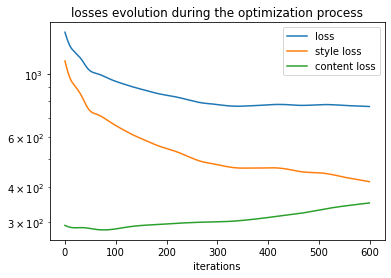

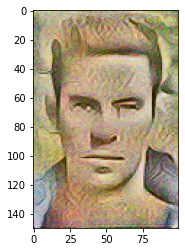

In [11]:
plt.plot(losses, label = 'loss')
plt.plot(style_losses, label='style loss')
plt.plot(content_losses, label='content loss')
plt.yscale('log')
plt.xlabel('iterations')
plt.title('losses evolution during the optimization process')
plt.legend()
plt.show()
plt.imshow(normalize(generated_image))
plt.show()

content image


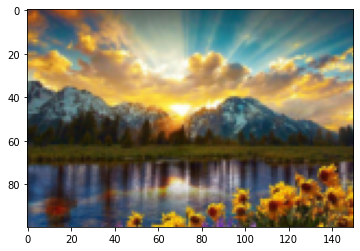

style image


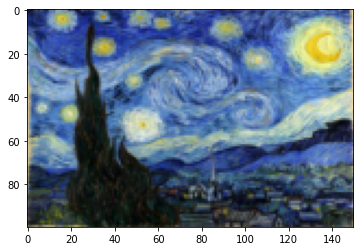

In [32]:
width = 150
height = 100
content_path = 'images/content_images/Landscape-Photography-steps.jpg'
style_path = 'images/style_images/starry_night_full.jpg'
content_image = io.imread(content_path)
content_image = preprocessing(content_image, output_shape=(height, width))
style_image = io.imread(style_path)
style_image = preprocessing(style_image, output_shape=(height, width))
print("content image")
plt.imshow(reshape_reverse(content_image[0]))
plt.show()
print("style image")
plt.imshow(reshape_reverse(style_image[0]))
plt.show()

0
loss 1326.1420772703493
content loss 248.33485383968664
style loss 1077.8072234306626


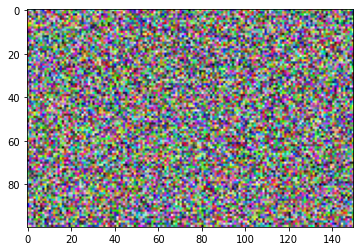

20
loss 1029.3216280424267
content loss 226.73481522192924
style loss 802.5868128204975


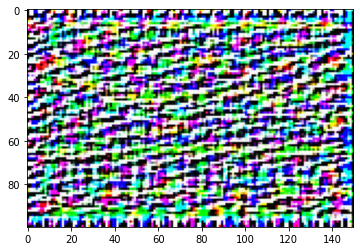

40
loss 799.3701439179118
content loss 218.12296133655317
style loss 581.2471825813586


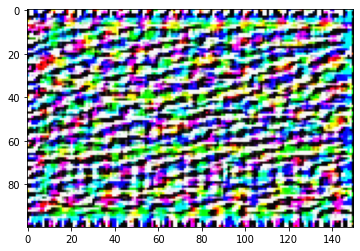

60
loss 668.144821118017
content loss 220.97080768494223
style loss 447.1740134330748


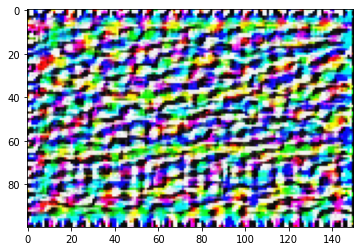

80
loss 673.082454434127
content loss 230.73307417565937
style loss 442.34938025846765


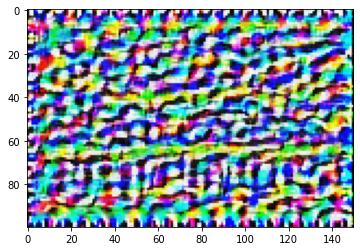

100
loss 667.9031768883342
content loss 239.11557189973013
style loss 428.787604988604


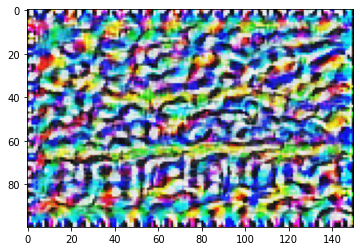

120
loss 628.997821525158
content loss 244.5098741257099
style loss 384.48794739944805


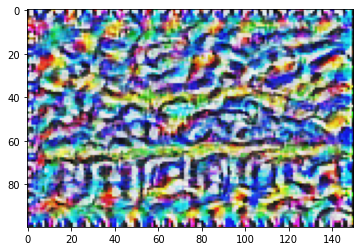

140
loss 602.0629197428343
content loss 249.79195388221268
style loss 352.27096586062163


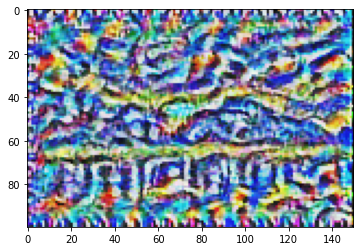

160
loss 576.7940215411634
content loss 256.1421681453354
style loss 320.6518533958279


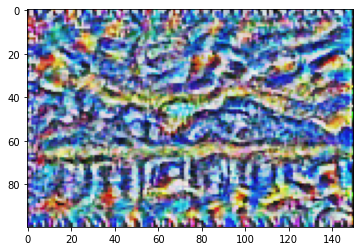

180
loss 563.7218470486234
content loss 264.28900010096805
style loss 299.43284694765543


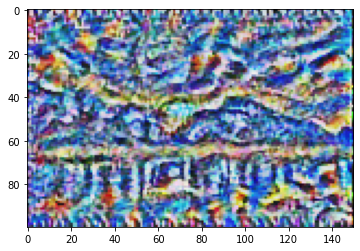

200
loss 565.1709377959769
content loss 273.8631292105439
style loss 291.307808585433


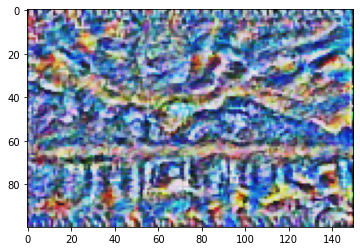

220
loss 573.1057903749845
content loss 283.21418601214634
style loss 289.89160436283817


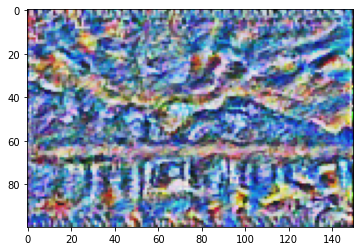

240
loss 573.9599175364119
content loss 290.4755916423021
style loss 283.4843258941098


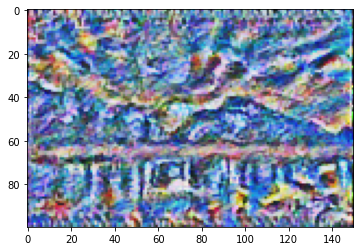

260
loss 563.3267235755485
content loss 295.2584353106767
style loss 268.0682882648718


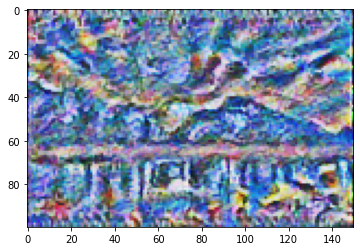

280
loss 548.9534950257147
content loss 298.08952406991915
style loss 250.86397095579557


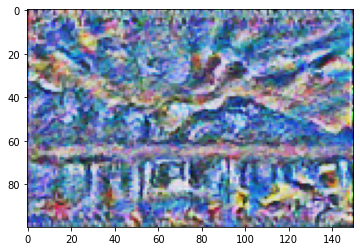

300
loss 537.8016918394021
content loss 300.1678924481287
style loss 237.63379939127336


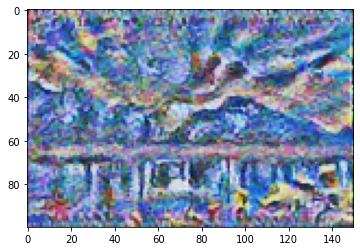

320
loss 530.0126352757994
content loss 301.85879974209183
style loss 228.1538355337076


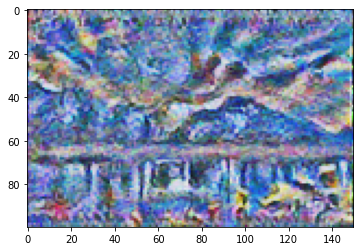

340
loss 524.489664794138
content loss 303.10513309878917
style loss 221.38453169534876


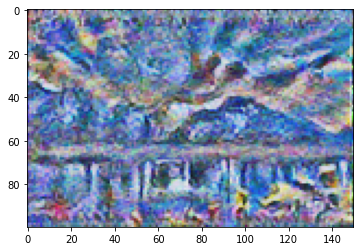

360
loss 523.7382774914958
content loss 304.26989849226936
style loss 219.46837899922642


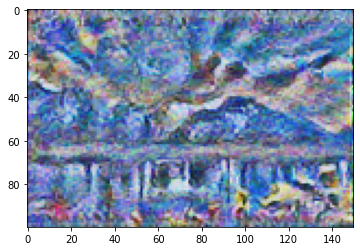

380
loss 525.1128532162943
content loss 305.22125221899086
style loss 219.8916009973034


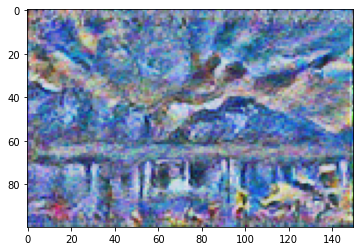

400
loss 525.2058793570783
content loss 305.9374726816782
style loss 219.2684066754001


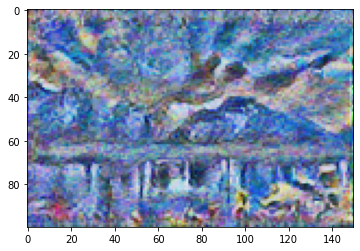

420
loss 523.0868683825934
content loss 306.4200949963131
style loss 216.66677338628025


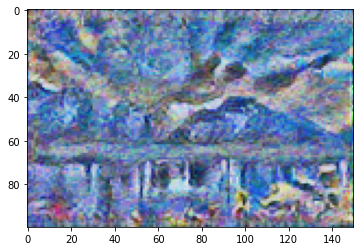

440
loss 519.7060416535433
content loss 306.5536489375056
style loss 213.15239271603767


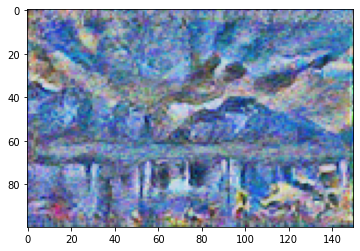

460
loss 516.5110082430965
content loss 306.31030476422796
style loss 210.2007034788686


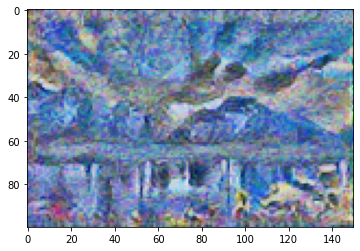

480
loss 512.3669886960299
content loss 305.57061722195857
style loss 206.7963714740713


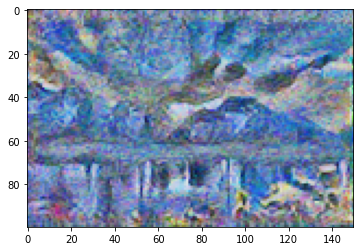

500
loss 507.05595611713966
content loss 304.25640447926014
style loss 202.79955163787955


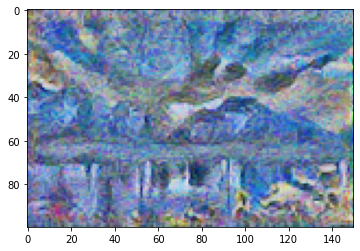

520
loss 501.587338830339
content loss 302.4556047143256
style loss 199.13173411601338


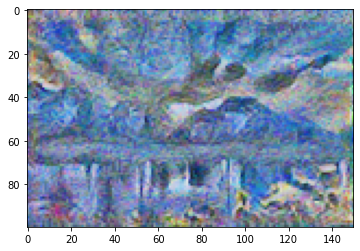

540
loss 496.4369260951064
content loss 300.5324249009591
style loss 195.90450119414731


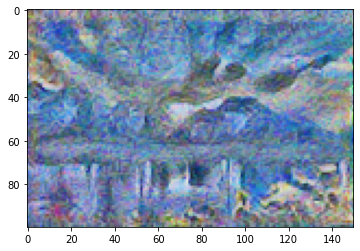

560
loss 491.53374683098093
content loss 298.83481553569777
style loss 192.69893129528316


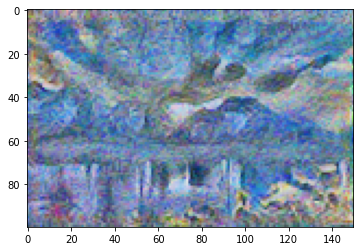

580
loss 486.06177281840314
content loss 297.3597717933754
style loss 188.70200102502773


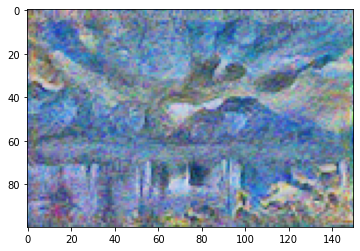

tempas écoulé 495.75091457366943


In [33]:
layers_style = [Relu1_2, Relu2_2, Relu3_3]
layer_content = Relu2_1
generated_image, losses, style_losses, content_losses = \
texture_synthetis_algorithm(style_image, content_image, nb_iter=600, lbd=10**-3,
                                    betha=1, alpha=100, layers_style=layers_style,
                                    layer_content=layer_content)


In [ ]:
plt.plot(losses, label = 'loss')
plt.plot(style_losses, label='style loss')
plt.plot(content_losses, label='content loss')
plt.yscale('log')
plt.xlabel('iterations')
plt.title('losses evolution during the optimization process')
plt.legend()
plt.show()
plt.imshow(normalize(generated_image))
plt.show()